# show images segmentation masks

In [1]:
import cracktools as ct
import matplotlib.pyplot as plt
import numpy as np
import json
from skimage.segmentation import mark_boundaries


In [6]:
FOLDER = 'C:/Users/20214106/Desktop/cracktools gui/crack images'

json_names = ct.tools.get_files(folder = FOLDER,formats = ['json'],basename = False) 
print(json_names)


['C:/Users/20214106/Desktop/cracktools gui/crack images\\361.json']


C:\Users\20214106\Desktop\cracktools gui\crack images\361.JPG


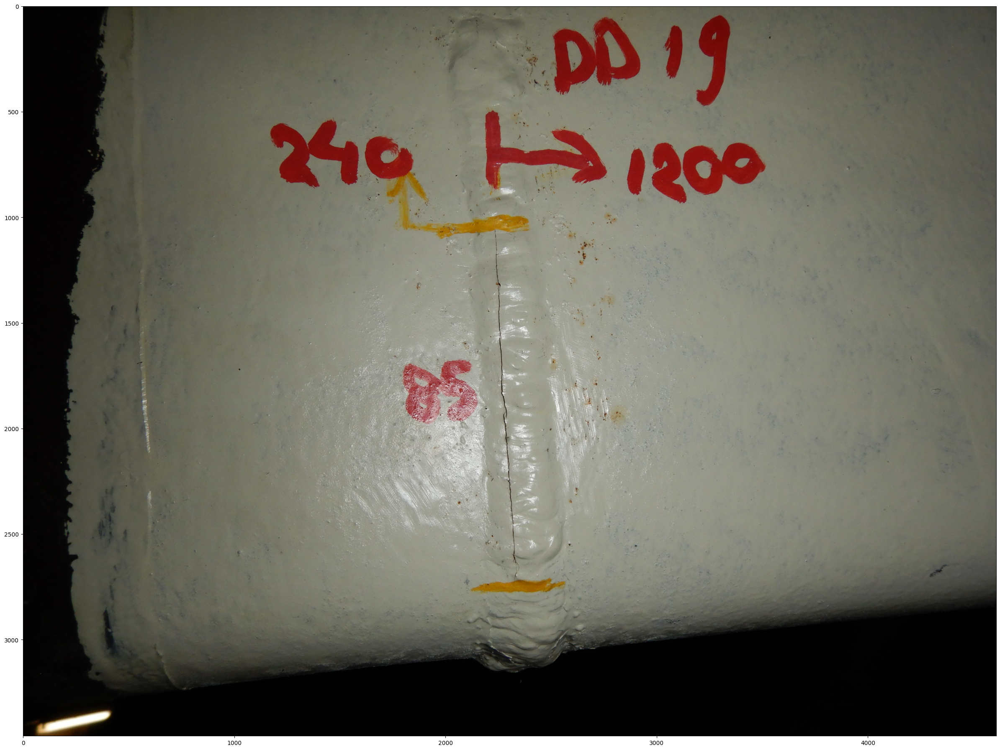

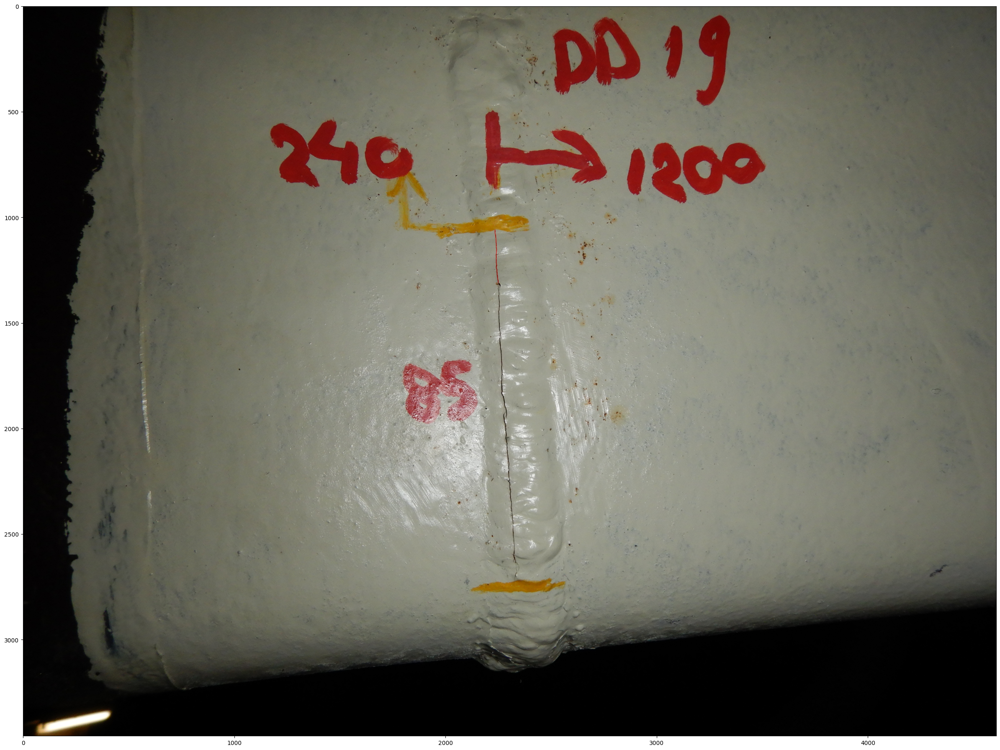

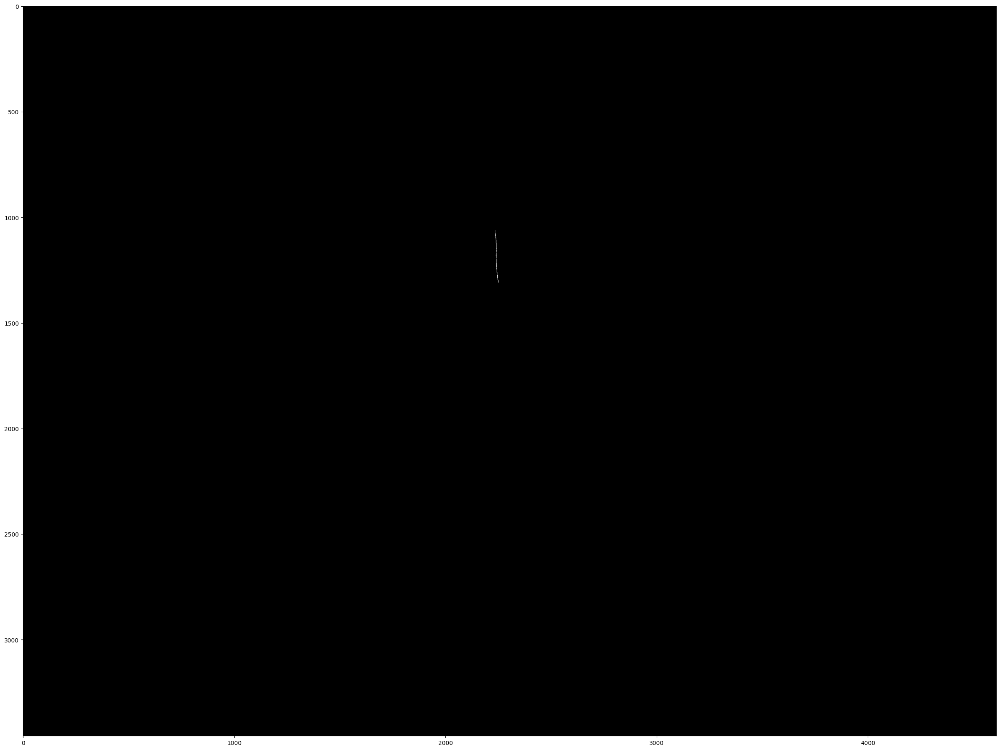

In [11]:
s = 0
for name in json_names:
    with open(name) as json_file:
        data = json.load(json_file)
    image = ct.tools.image_load(data['file_name'])
    colors = ['b','g','r','c','m','y','k','w']
    if 'annotations' in data.keys():
        if 'crack_pixels' in  data['annotations'].keys():
            print(data['file_name'])
            s = s+1
            crack_pixels = data['annotations']['crack_pixels']
            mask = np.zeros((image.shape[0],image.shape[1]))
            c = np.array(crack_pixels)
            mask[list(c[:,0]),list(c[:,1])] = 1
            p = np.argwhere(mask==1)
            min_x = np.min(p[:,1])
            max_x = np.max(p[:,1])
            min_y = np.min(p[:,0])
            max_y = np.max(p[:,0])
            edges_pz = mark_boundaries(image, mask,
                                                color=(1,0,0), mode='inner', background_label=1)
            ct.tools.show_image(image,frame_size=30)
            plt.show()
            ct.tools.show_image(edges_pz,frame_size=30)
            plt.show()
            ct.tools.show_image(mask,frame_size=30)
            plt.show()